In [1]:
import os
import numpy as np
from scipy.ndimage import laplace
from skimage.io import imread
import matplotlib.pyplot as plt

#### Diffusion solution

In [2]:
def plot_diffusion(ylim, area_all, shift, umask, nx,ymin, ymax, rad_shift,filename, tfin):
    ## GET THE SHIFT CORRECT !
    plt.figure(figsize=(9,4.2))
    #ylim = (edt.max() + 16) * 1.35
    rad_blocks = np.sqrt(area_all / np.pi) / 16
    #shift = 0
    tf = umask[shift:, int(nx // 2), ymin:ymax].shape[0]
    
    # Plot the image
    plt.imshow(umask[shift:, int(nx // 2), ymin:ymax].transpose(), aspect='auto', cmap='jet')
    
    # Plot the overlaid lines
    plt.plot(np.linspace(0, tf, num=len(rad_blocks)), rad_blocks + rad_shift, '--k')
    plt.plot(np.linspace(0, tf, num=len(rad_blocks)), -rad_blocks + rad_shift, '--k')
    
    # Add the colorbar
    plt.colorbar()
    
    # Add title and labels with the specified font sizes
    plt.title('Diffusion field solution', fontsize=18)  # Title with fontsize 18
    plt.xlabel('Time [h]', fontsize=16)  # X label fontsize 14
    plt.ylabel('Radial distance [$\mu m$]', fontsize=16)  # Y label fontsize 14
    
    # Set the y-tick positions and labels to limit the number of points shown
    ytick_positions = np.linspace(0, umask[shift:, int(nx // 2), ymin:ymax].shape[1]-1, num=5)  # Limit to 5 ticks
    
    plt.yticks(ytick_positions, labels=np.linspace(-ylim, ylim, num=5).astype(int), fontsize=16)  # Set labels and fontsize 14 for y-ticks
    plt.gca().invert_yaxis()
    # Now set the x-ticks correctly
    # Calculate the time shift in hours
    time_shift_hours = (shift * dt) / 3600
    
    # Set the xtick positions to match the pixel positions
    xtick_positions = np.linspace(0, tf, num=6)  # Generate tick positions based on the pixel index range
    xtick_labels = np.linspace(time_shift_hours, tfin, num=6, dtype=int)  # Set labels from time shift to 32 hours
    
    plt.xticks(xtick_positions, labels=xtick_labels, fontsize=16)  # Apply the tick positions and labels, fontsize 14 for x-ticks
    
    # Set the x-axis limits to match the range of the data (prevent extra white space)
    plt.xlim(0, tf)  # Restrict x-axis to the data range
    
    plt.tight_layout()
    plt.savefig(filename,dpi=300)
    plt.show()

#### Gene expression solution

In [3]:
def plot_gene_expression(tini, fini, fend, pmask, crop_im, pchannel,imchannel, color,ymin,ymax,dt):
    ## check colorbars, if using the same scale
    tdata_base = tini * 60 / 10
    
    ## from tmodel
    #tmodel = 5000
    #tdata = int(tdata_base + (tmodel * dt / (60 * 10)))
    channel = 0
    for td in np.arange(fini,fend):
        ## from tdata
        tdata = td#72
        tmodel = int((tdata - tdata_base) * 60 * 10 / dt)
        
        plt.figure(figsize=(10,5))
        
        plt.subplot(1,2,1)
        ## it starts at 12 hours of imaging
        #plt.imshow(pmask[0,7:30,7:30,0])
        plt.imshow(pmask[tmodel,ymin:ymax,ymin:ymax,pchannel],cmap=color)
        plt.title('Model')
        plt.colorbar()
        
        ## it starts at imaging
        ## 12 hours is 12*60 / 10
        plt.subplot(1,2,2)
        #plt.imshow(crop_im[72,7:30,7:30,0])
        plt.imshow(crop_im[tdata,ymin:ymax,ymin:ymax,imchannel],cmap=color)
        plt.title('Data')
        plt.colorbar()
        plt.show()

#### Kymo mean expression Image

In [4]:
def make_kymo_im(im_all):
    # Assuming im_all is your image stack of shape (216, 37, 37)
    nt, nx, ny = im_all.shape
    
    # Calculate the radial distances for all pixels from the center of the image
    x_center = nx // 2
    y_center = ny // 2
    y, x = np.ogrid[:ny, :nx]
    radii = np.sqrt((x - x_center)**2 + (y - y_center)**2)
    
    # Define the radial bands (you can adjust the range if needed)
    rs = np.arange(1, crop_im.shape[1] //2 + 1)  # Radial distances (from 1 to 18)
    
    # Initialize an array to store the mean intensity for each band over time
    imrmean = np.zeros((nt, len(rs))) + np.nan
    
    # Loop over each time point and calculate the mean for each radial band
    for t in range(nt):
        for i, r in enumerate(rs):
            # Get the pixels that fall within the current radial band
            mask = (radii >= r - 0.5) & (radii < r + 0.5)
            
            # Extract the corresponding pixel values from the image
            pixels_in_band = im_all[t, mask]
            
            # Calculate the mean for the radial band, ignoring NaNs
            if len(pixels_in_band) > 0:
                imrmean[t, i] = np.nanmean(pixels_in_band)
    
    # Now, rmean contains the kymograph: time (216) by radial distance (19)
    return imrmean

#### Kymo mean expression P

In [5]:
def make_plot_p(im_all, fini, fend, dt):
    _,nx,ny = im_all.shape
    # Assuming im_all is your image stack of shape (216, 37, 37)
    nt = fend
    
    # Calculate the radial distances for all pixels from the center of the image
    x_center = nx // 2
    y_center = ny // 2
    y, x = np.ogrid[:ny, :nx]
    radii = np.sqrt((x - x_center)**2 + (y - y_center)**2)
    
    # Define the radial bands (you can adjust the range if needed)
    rs = np.arange(1, nx // 2)  # Radial distances (from 1 to 18)
    
    # Initialize an array to store the mean intensity for each band over time
    mrmean = np.zeros((nt, len(rs))) + np.nan
    
    # Loop over each time point and calculate the mean for each radial band
    
    tbase = fini
    #tim = 100
    
    for tim in range(tbase,nt):
        tmodel = (tim - tbase) * 60 * 10 / dt
        t = tmodel
        for i, r in enumerate(rs):
            # Get the pixels that fall within the current radial band
            mask = (radii >= r - 0.5) & (radii < r + 0.5)
            
            # Extract the corresponding pixel values from the image
            pixels_in_band = im_all[t, mask]
            
            # Calculate the mean for the radial band, ignoring NaNs
            if len(pixels_in_band) > 0:
                mrmean[tim, i] = np.nanmean(pixels_in_band)
    
    # Now, rmean contains the kymograph: time (216) by radial distance (19)

#### Plot kymos

In [6]:
def plot_kymos(imrmean,fini, fend,mrmean,ymin, ymax):
    plt.figure(figsize=(8, 8))  # Adjust the figure size to fit two rows
    
    # First subplot: Kymograph Image (Top row)
    plt.subplot(2, 1, 1)  # 2 rows, 1 column, 1st plot (top)
    imkymograph = np.hstack([imrmean[:fend+1, ::-1], imrmean[:fend+1, :]])
    plt.imshow(imkymograph.T[ymin:ymax, fini:], aspect='auto', cmap='Reds')
    
    # Add labels and titles
    plt.title('Kymograph Image', fontsize=14)
    plt.xlabel('Time', fontsize=12)
    plt.ylabel('Radial Distance', fontsize=12)
    plt.colorbar()
    
    # Second subplot: Kymograph Model (Bottom row)
    plt.subplot(2, 1, 2)  # 2 rows, 1 column, 2nd plot (bottom)
    mkymograph = np.hstack([mrmean[:, ::-1], mrmean[:, :]])
    plt.imshow(mkymograph.T[ymin:ymax, fini:], aspect='auto', cmap='Reds')
    
    # Add labels and titles
    plt.title('Kymograph Model', fontsize=14)
    plt.xlabel('Time', fontsize=12)
    plt.ylabel('Radial Distance', fontsize=12)
    plt.colorbar()
    
    # Tighten the layout to ensure no overlap
    plt.tight_layout()
    
    # Show the combined figure with both subplots in 2 rows
    plt.show()

#### Plot Delta

In [7]:
def plot_delta(ylim,tini,tend,ymin, ymax,dt,filename,vmin,vmax):
    plt.figure(figsize=(9,8))
    
    idx0 = int(tini * 60 * 60 // dt // 60 * 10 / dt)  # when start after growth rate
    idx1 = int(tend * 60 * 60 // dt // 60 * 10 / dt)  # when wave arrives
    
    # First subplot (Model)
    plt.subplot(2, 1, 1)
    plt.imshow(mdslrho[:, int(nx // 2), ymin:ymax].transpose(), aspect='auto', cmap='jet',origin='lower', vmin=vmin, vmax=vmax)
    plt.title('Model $\Delta_{ry}$', fontsize=18)  # Title with fontsize 18
    plt.colorbar()
    plt.xticks([])  # Remove x-ticks for the top plot
    plt.yticks(np.linspace(0, mdslrho[:, int(nx // 2), ymin:ymax].shape[1], num=5), labels=np.linspace(-ylim, ylim, num=5).astype(int), fontsize=16)  # Y-ticks using ylim, fontsize 14
    plt.ylabel('Radial distance [$\mu m$]', fontsize=16)  # Y-axis label font size 14
    
    # Second subplot (Data)
    plt.subplot(2, 1, 2)
    plt.imshow(dslrho_01[idx0:idx1, int(nx // 2), ymin:ymax].transpose(), aspect='auto', cmap='jet',origin='lower', vmin=vmin, vmax=vmax)
    plt.title('Data $\Delta_{ry}$', fontsize=18)  # Title with fontsize 18
    plt.colorbar()
    
    # Set the x-ticks and labels
    xtick_positions = np.linspace(0, idx1 - idx0, num=6)  # Generate tick positions for the whole range
    xtick_labels = np.linspace(tini, tend, num=6, dtype=int)  # Adjust labels accordingly
    plt.xticks(xtick_positions, labels=xtick_labels, fontsize=16)  # X-ticks with fontsize 14
    plt.yticks(np.linspace(0, dslrho_01[idx0:idx1, int(nx // 2), ymin:ymax].shape[1], num=5), labels=np.linspace(-ylim, ylim, num=5).astype(int), fontsize=14)  # Y-ticks using ylim, fontsize 14
    plt.xlabel('Time [h]', fontsize=16)  # X-axis label font size 14
    plt.ylabel('Radial distance [$\mu m$]', fontsize=16)  # Y-axis label font size 14
    
    plt.tight_layout()
    plt.savefig(filename,dpi=300)
    plt.show()

In [ ]:
## all 3 colonies
#exp_date = '2023_11_30'
vector = 'pAAA'
scope_name = 'Tweez scope'
pos = 15
dt = 5

exp_date = '2023_12_08'
#vector = 'pLPT20&pLPT41'
scope_name = 'Tweez scope'
pos = 12
dt = 10

exp_date = '2023_12_06'
#vector = 'pLPT20&pLPT41'
scope_name = 'Tweez scope'
pos = 14
dt = 10

In [8]:
path_ext = '/media/guillermo/Expansion/Thesis GY/3. Analyzed files'
folder_results = 'results'
folder_velocity = 'velocity_data'

scopes = {'Tweez scope': 'TiTweez', 'Ti scope': 'Ti'}
dnas = {'pLPT20&pLPT41': 'pLPT20&41', 'pLPT119&pLPT41': 'pLPT119&41', 'pAAA': 'pAAA', 'pLPT107&pLPT41': 'pLPT107&41'}

In [9]:
#exp_date = '2023_11_30'
exp_date = '2023_12_08'
#exp_date = '2023_12_06'

#vector = 'pAAA'
vector = 'pLPT20&pLPT41'

#scope_name = 'Ti scope'
scope_name = 'Tweez scope'
pos = 12
dt = 10

path_scope = os.path.join(path_ext, scope_name)
path = os.path.join(path_scope, exp_date)
path_results = os.path.join(path,folder_results, f"pos{pos}")
path_velocity = os.path.join(path,folder_velocity, f"pos{pos}")

fname = f'{exp_date}_10x_1.0x_{dnas[vector]}_{scopes[scope_name]}_Pos{pos}.ome.tif'
fname

'2023_12_08_10x_1.0x_pLPT20&41_TiTweez_Pos12.ome.tif'

In [10]:
if vector == 'pLPT20&pLPT41' or vector == 'pLPT119&pLPT41':
    yfp_chn = 0
    cfp_chn = 1
    ph_chn = 2
    fluo_chns = 2
else:
    rfp_chn = 0
    yfp_chn = 1
    cfp_chn = 2
    ph_chn = 3
    fluo_chns = 3

In [11]:
pmask = np.load(os.path.join(path_results,'diff_pmask.npy')) # solution for gene expression
p = np.load(os.path.join(path_results,'diff_p.npy')) # p = pmask[:-1:120,:,:,:]
umask = np.load(os.path.join(path_results,'diff_umask.npy')) # solution for dilution
uu = np.load(os.path.join(path_results,'diff_uu.npy')) # uu = umask[:-1,:,:]
mrho = np.load(os.path.join(path_results,'diff_mrho.npy')) # model
mdslrho = np.load(os.path.join(path_results,'diff_mdslrho.npy')) # model
rho_01 = np.load(os.path.join(path_results,'diff_rho_01.npy')) # data
dslrho_01 = np.load(os.path.join(path_results,'diff_dslrho_01.npy')) # data
crop_edt = np.load(os.path.join(path_results, 'diff_crop_edt.npy'))
crop_im = np.load(os.path.join(path_results, 'diff_crop_im.npy'))
area_all = np.load(os.path.join(path_results,'diff_area_all.npy'))

In [12]:
edt = np.load(os.path.join(path_results,'edt.npy'))
#edt = crop_edt
ntt,nx,ny = crop_edt.shape
nt,nx,ny,nc = crop_im.shape
dt = 10

#### Diffusion solution

In [15]:
ylim = (edt.max() + 16) * 1.35
ylim

242.1959485122064

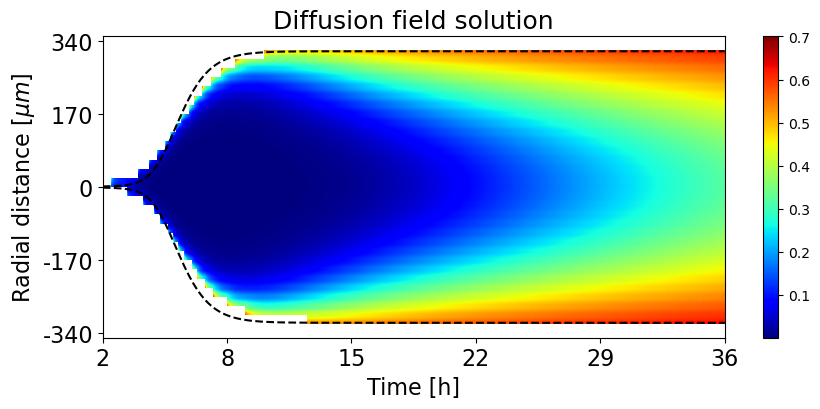

In [17]:
ylim = (edt.max() + 16) * 1.35
"""
# pAAA
ymin = 7
ymax=30
rad_shift = 11
shift = 0
filename = 'pAAA_diff_field.png'
tfin = 32
"""

#"""
# pLPT20
ymin = 14
ymax = 47
rad_shift = 16
shift = 800
filename = 'pLPT20_diff_field.png'
tfin = 36
#"""

"""
# pLPT20 IPTG
ymin = 15
ymax = 43
rad_shift = 13.5
shift = 0
filename = 'pLPT20_IPTG_diff_field.png'
tfin = 36
"""
plot_diffusion(ylim, area_all, shift, umask, nx, ymin, ymax, rad_shift,filename, tfin)

#### Gene expression solution

In [95]:
# pLPT20 YFP IPTG
tini = 8 # initial time when wave starts hours
tfin = 36
fini = 48 # initial frame when wave starts
fend = 216 # frame when wave stops

ymin = 16
ymax = 42
pchannel = 2
imchannel = 0
color = 'Greens'
dt = 10

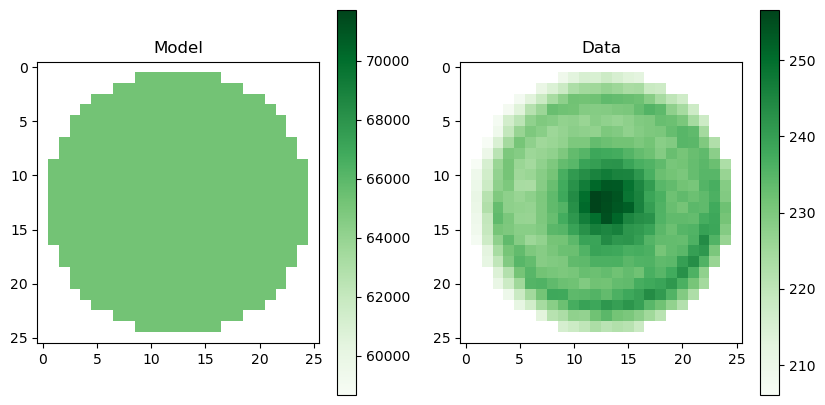

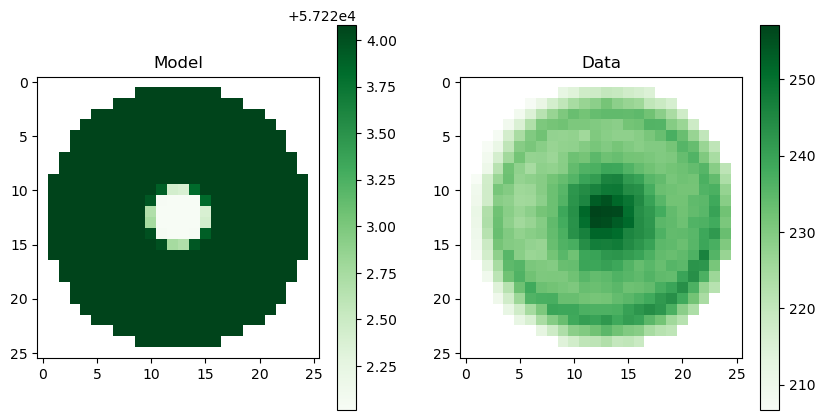

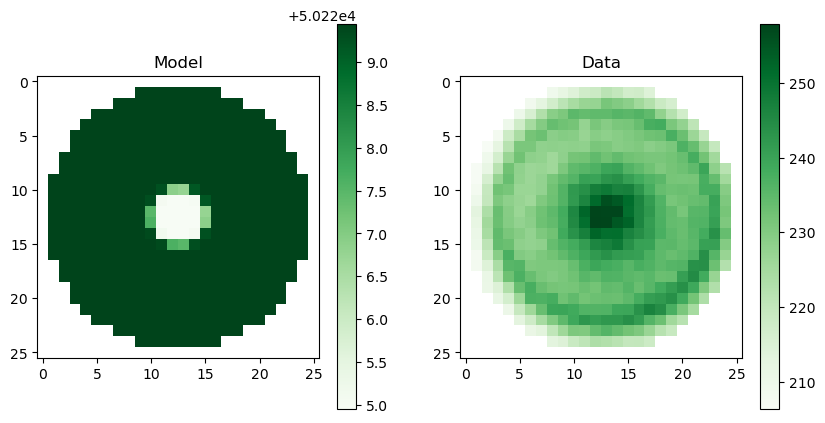

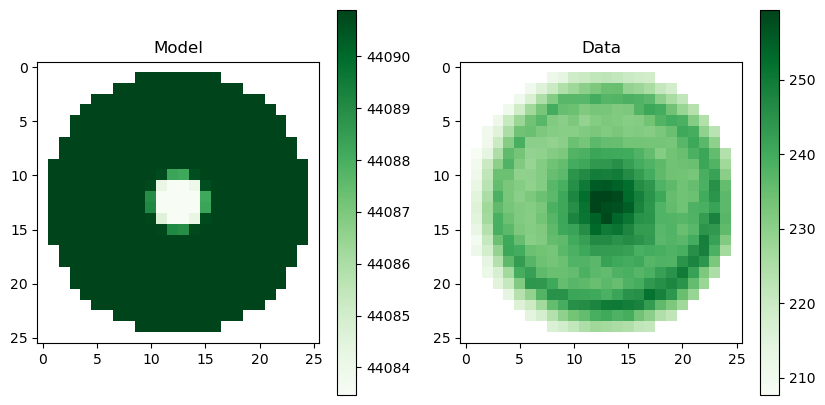

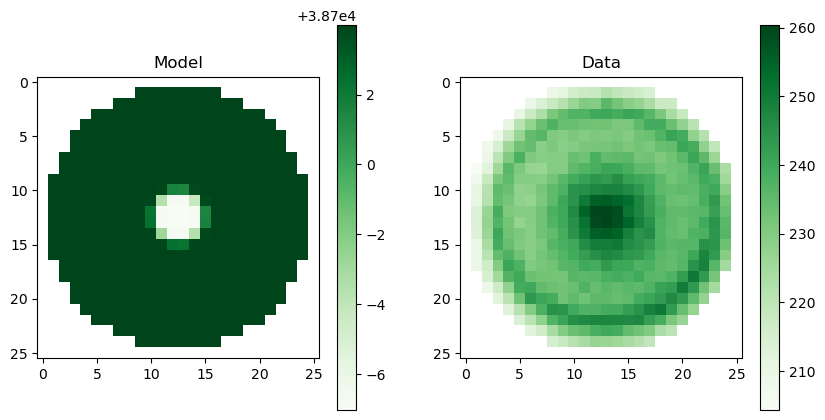

...

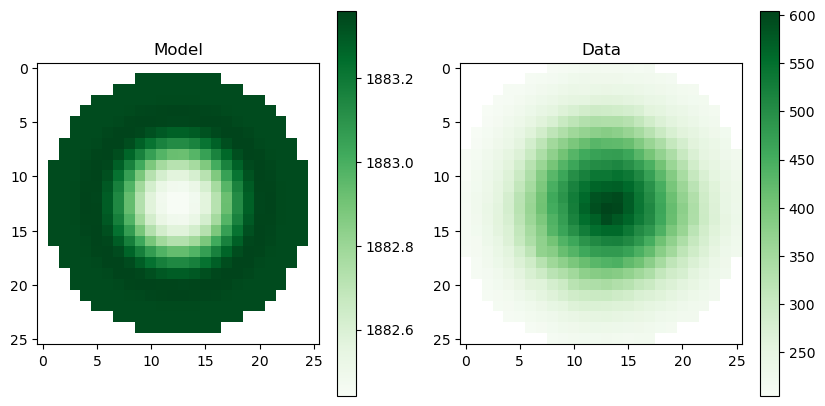

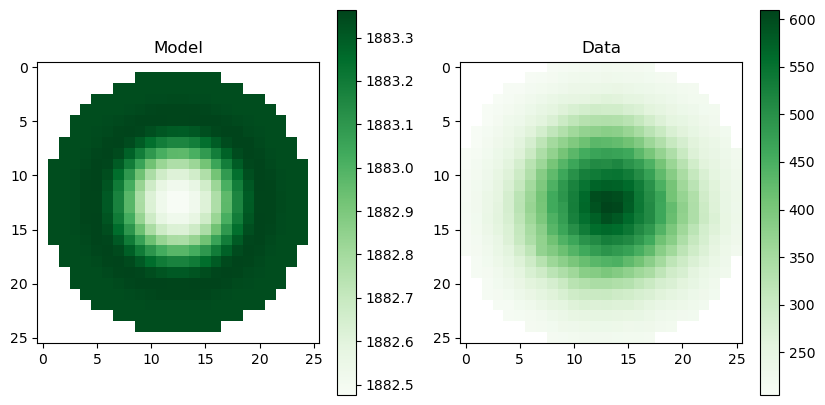

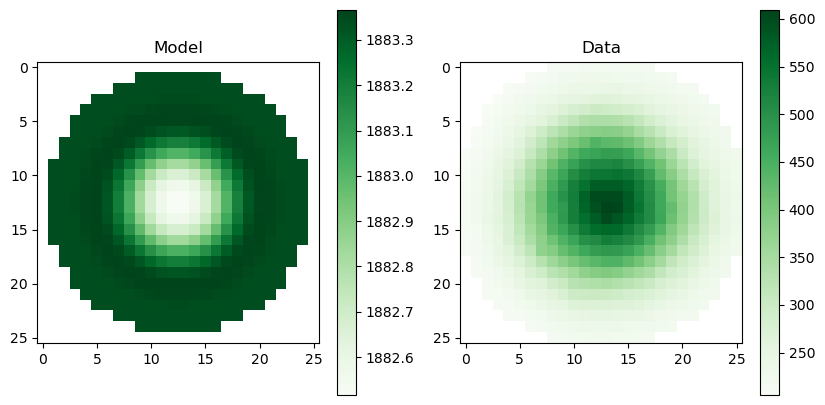

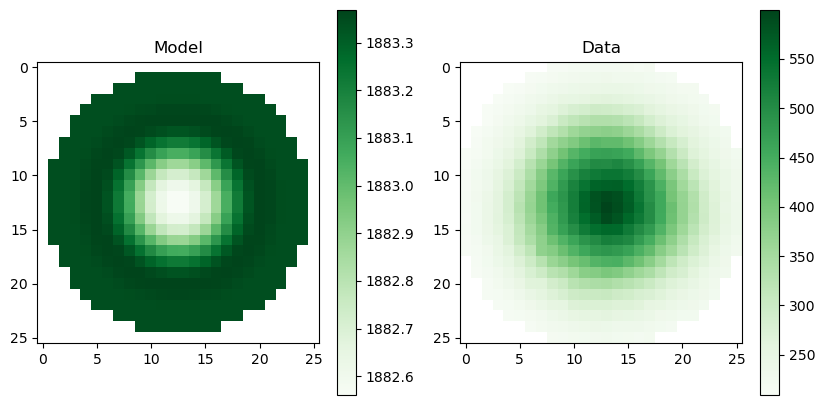

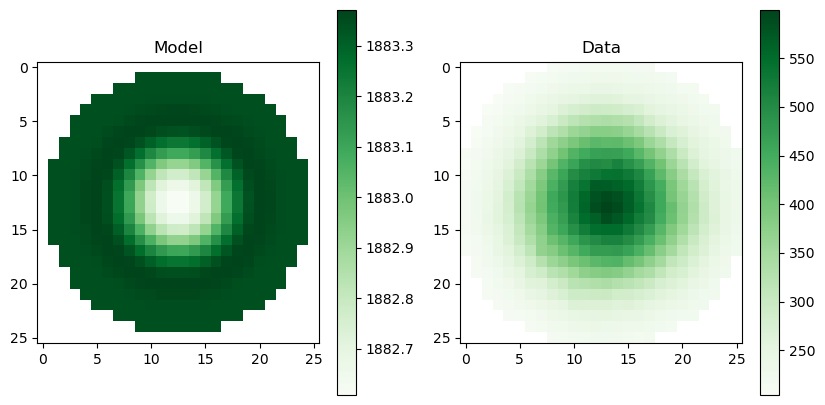

IndexError: index 216 is out of bounds for axis 0 with size 216

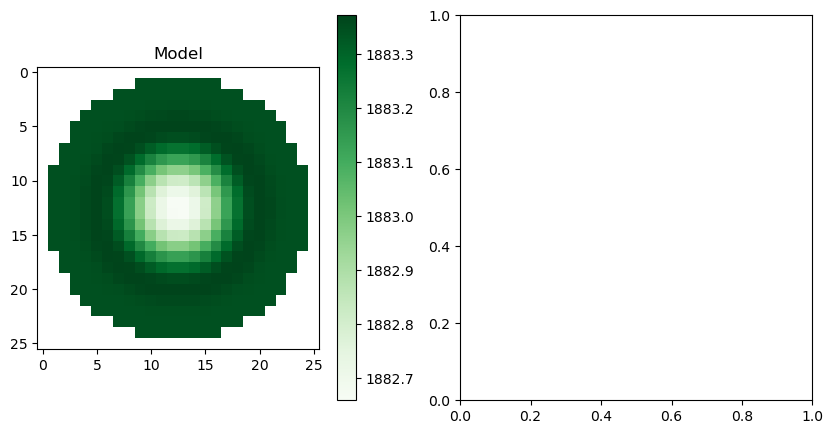

In [96]:
## check colorbars, if using the same scale
tdata_base = tini * 60 / 10

## from tmodel
#tmodel = 5000
#tdata = int(tdata_base + (tmodel * 5 / (60 * 10)))
pchannel = 2
imchannel = 0
for td in np.arange(fini,fend+1):
    ## from tdata
    tdata = td#72
    tmodel = int((tdata - tdata_base) * 60 * 10 / dt)
    
    plt.figure(figsize=(10,5))
    
    plt.subplot(1,2,1)
    ## it starts at 12 hours of imaging
    #plt.imshow(pmask[0,7:30,7:30,0])
    plt.imshow(pmask[tmodel,ymin:ymax,ymin:ymax,pchannel],cmap='Greens')
    plt.title('Model')
    plt.colorbar()
    
    ## it starts at imaging
    ## 12 hours is 12*60 / 10
    plt.subplot(1,2,2)
    #plt.imshow(crop_im[72,7:30,7:30,0])
    plt.imshow(crop_im[tdata,ymin:ymax,ymin:ymax,imchannel],cmap='Greens')
    plt.title('Data')
    plt.colorbar()
    plt.show()

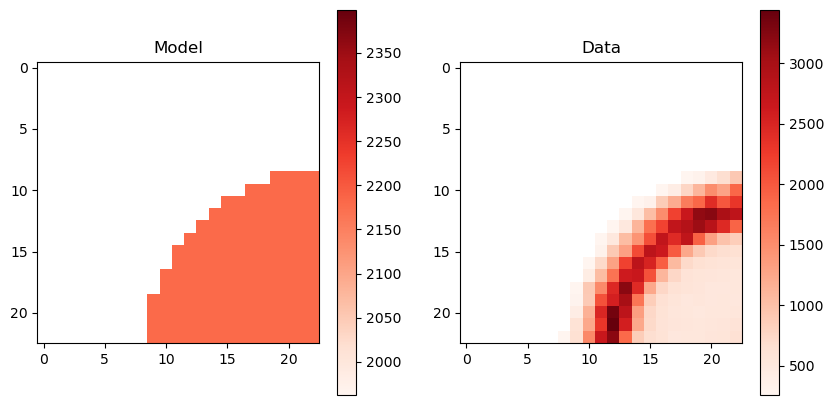

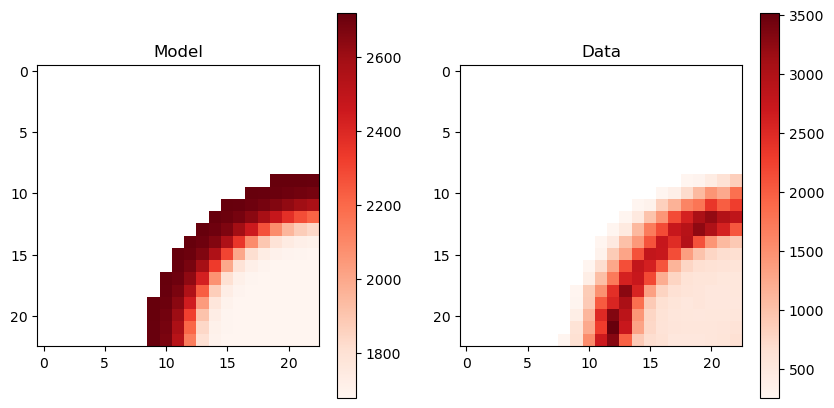

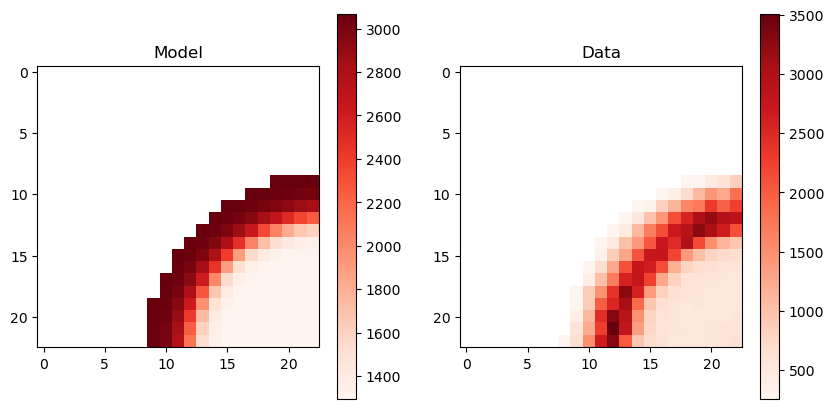

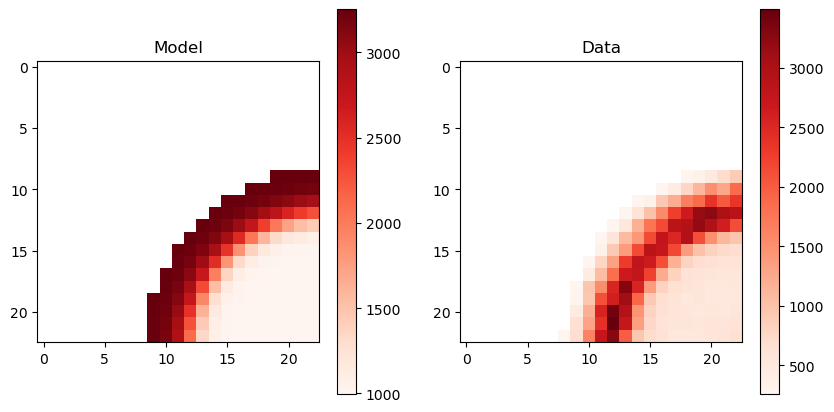

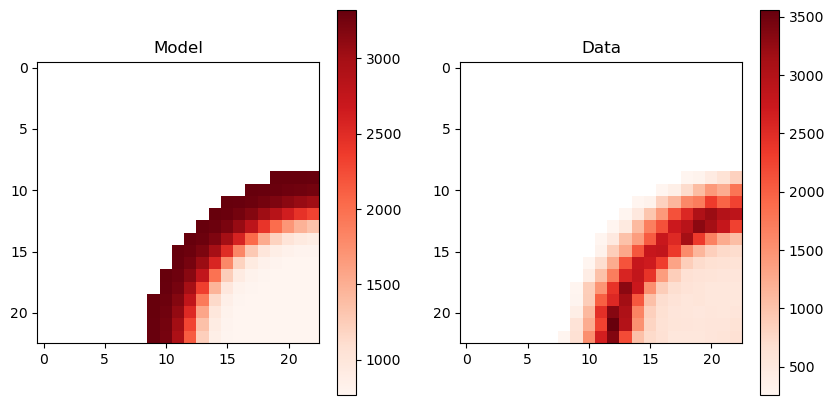

...

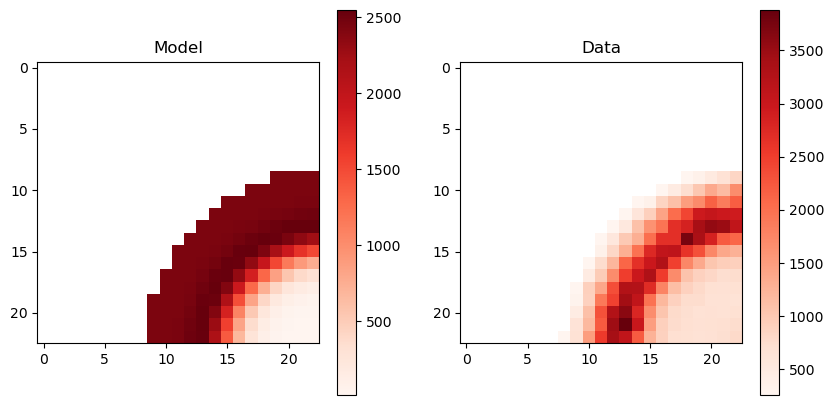

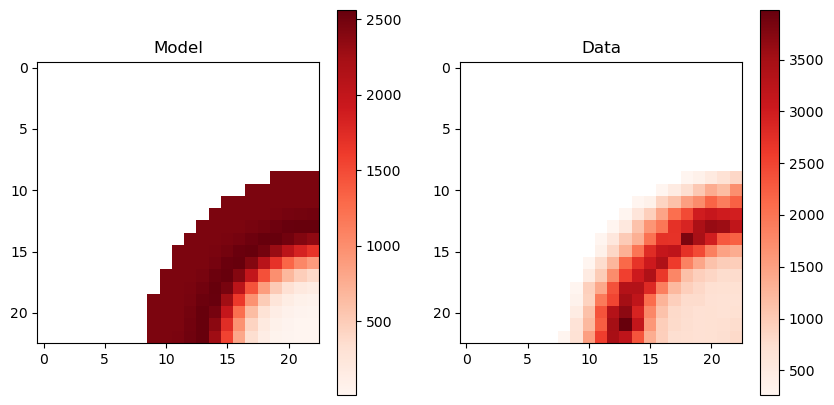

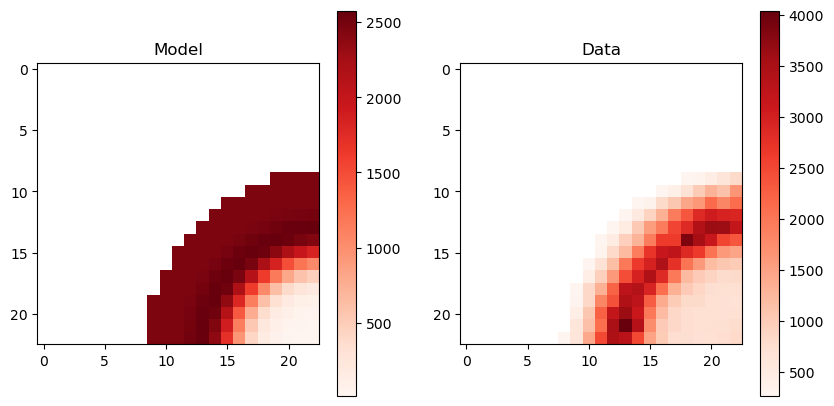

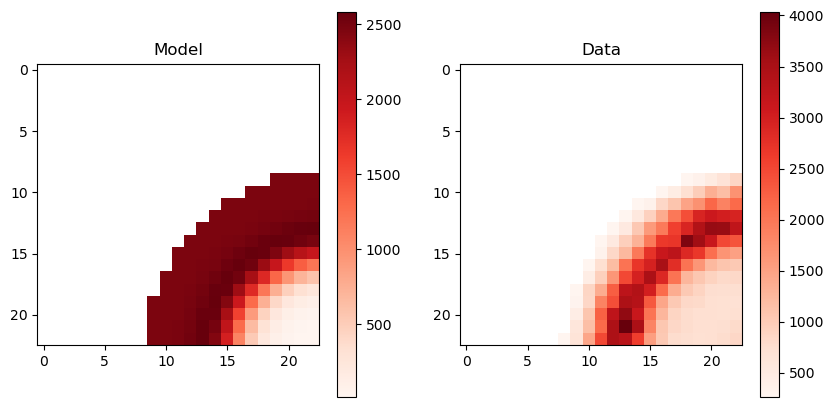

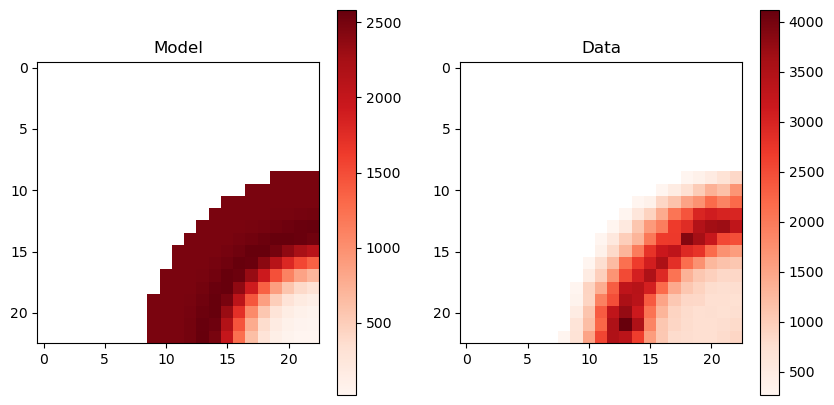

KeyboardInterrupt: 

In [120]:
# pAAA
tini = 12 # initial time when wave starts hours
tfin = 32
fini = 72 # initial frame when wave starts
fend = 192 # frame when wave stops
ymin = 7
ymax = 30
pchannel = 0
imchannel = 0
color = 'Reds'
dt = 5
plot_gene_expression(tini, fini, fend, pmask, crop_im, pchannel, imchannel, color, ymin, ymax,dt)

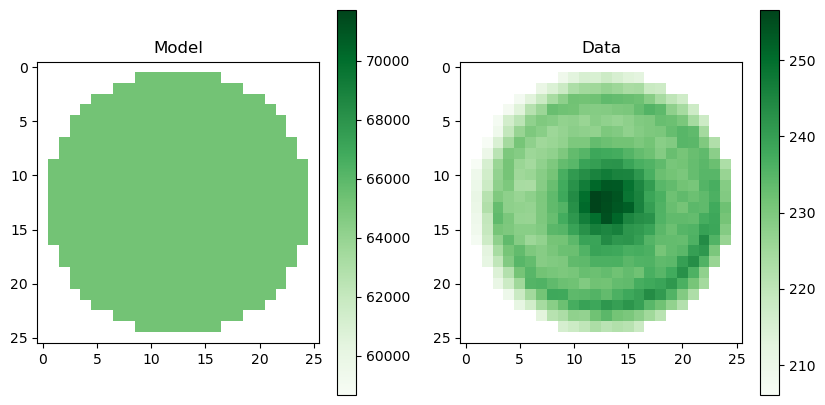

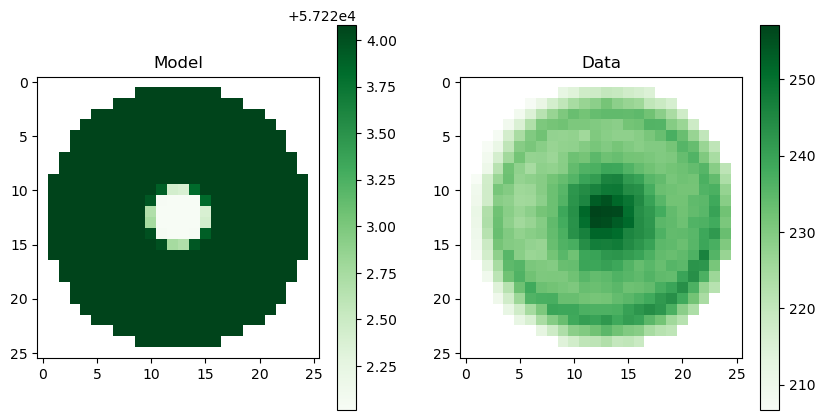

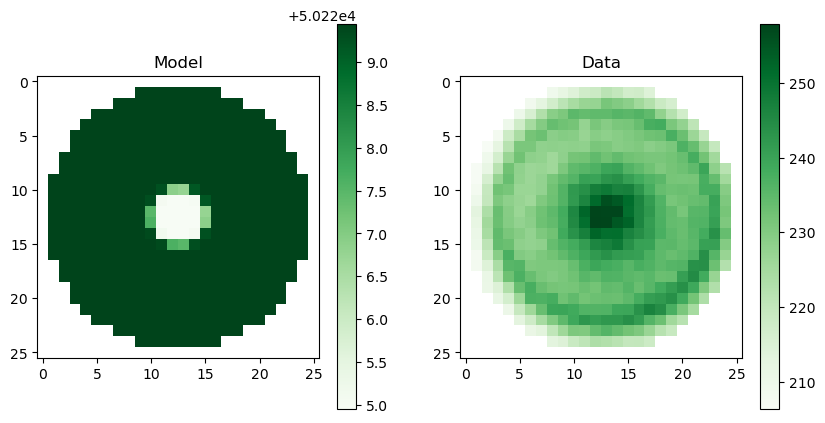

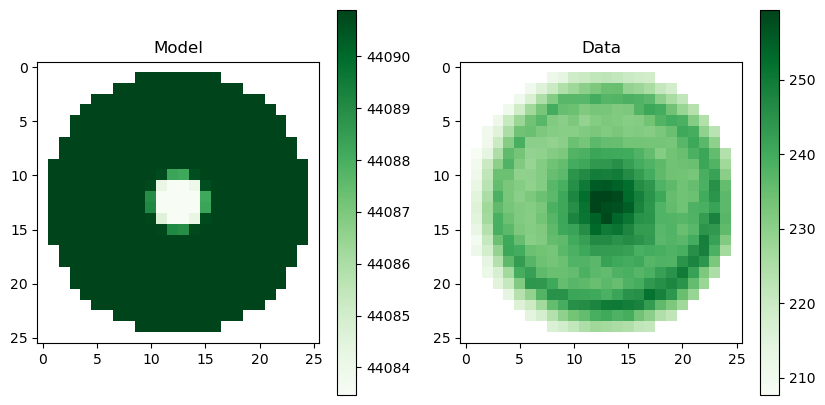

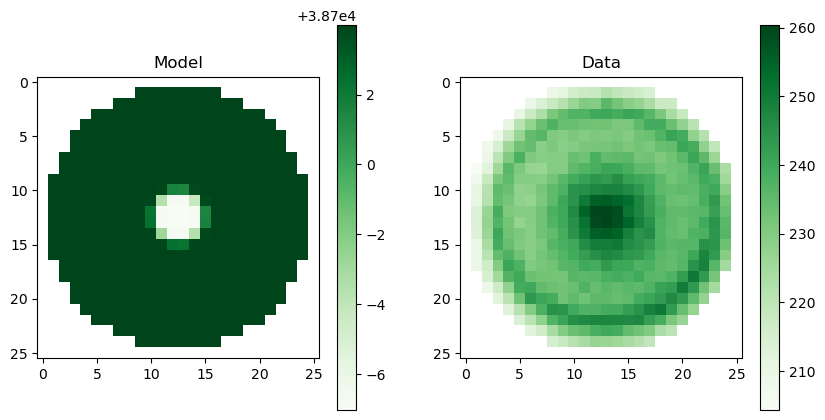

...

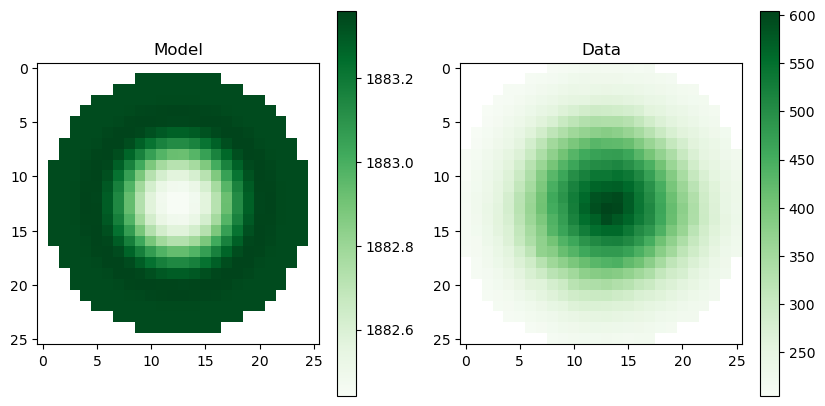

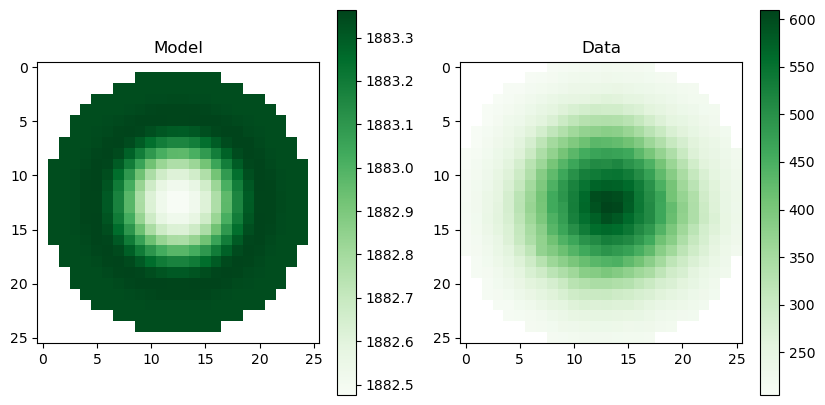

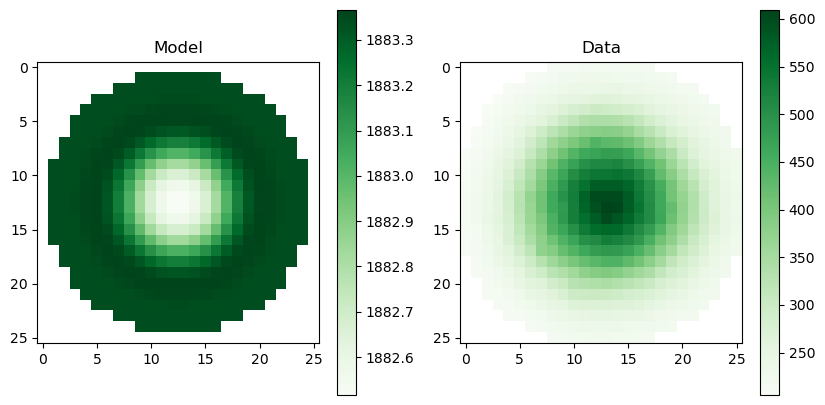

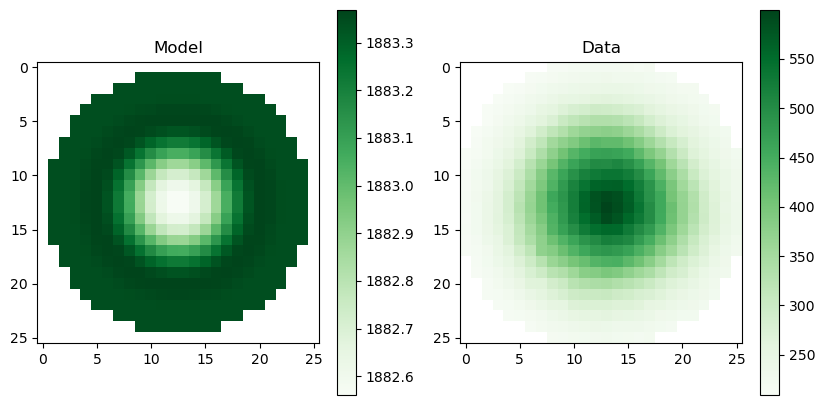

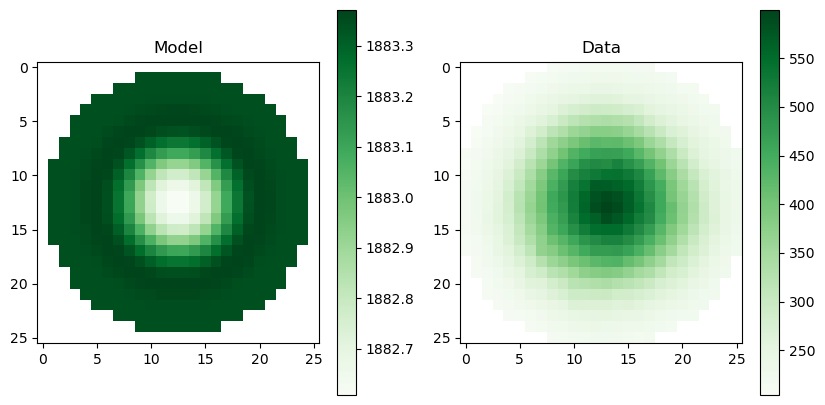

In [97]:
# pAAA
#tini = 12 # initial time when wave starts hours
#tfin = 32
#fini = 72 # initial frame when wave starts
#fend = 192 # frame when wave stops
#ymin = 7
#ymax = 30
#pchannel = 0
#imchannel = 0
#color = 'Reds'
dt = 5

"""
# pLPT20 YFP
tini = 8 # initial time when wave starts hours
tfin = 36
fini = 48 # initial frame when wave starts
fend = 216 # frame when wave stops

ymin = 15
ymax = 47
pchannel = 2
imchannel = 0
color = 'Greens'
dt = 10
"""
# pLPT20 YFP IPTG
tini = 8 # initial time when wave starts hours
tfin = 36
fini = 48 # initial frame when wave starts
fend = 216 # frame when wave stops

ymin = 16
ymax = 42
pchannel = 2
imchannel = 0
color = 'Greens'
dt = 10
plot_gene_expression(tini, fini, fend, pmask, crop_im, pchannel, imchannel, color, ymin, ymax,dt)

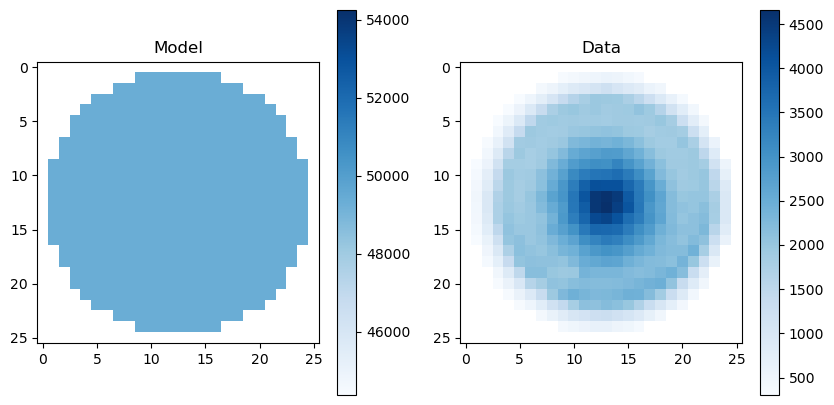

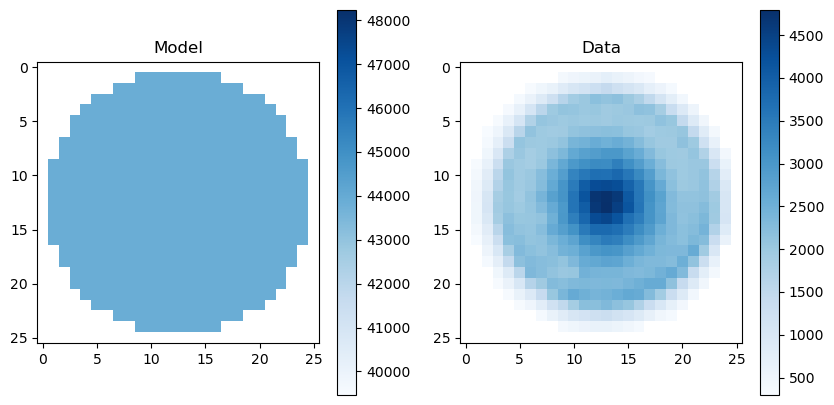

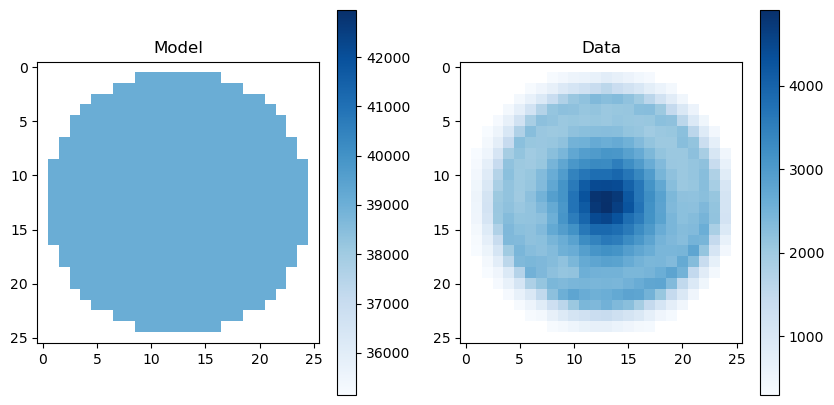

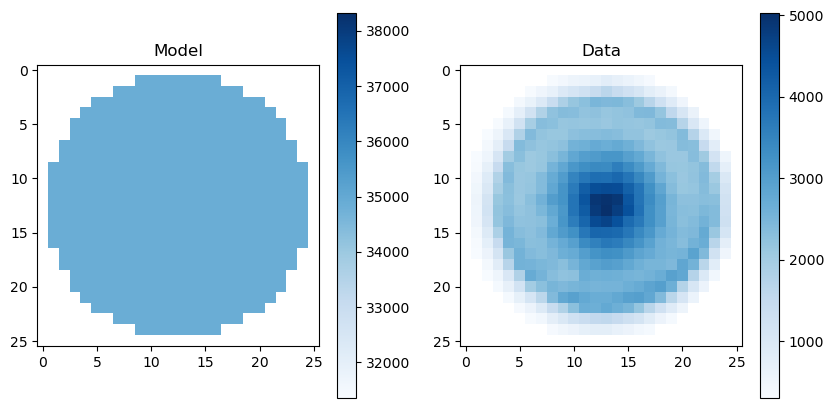

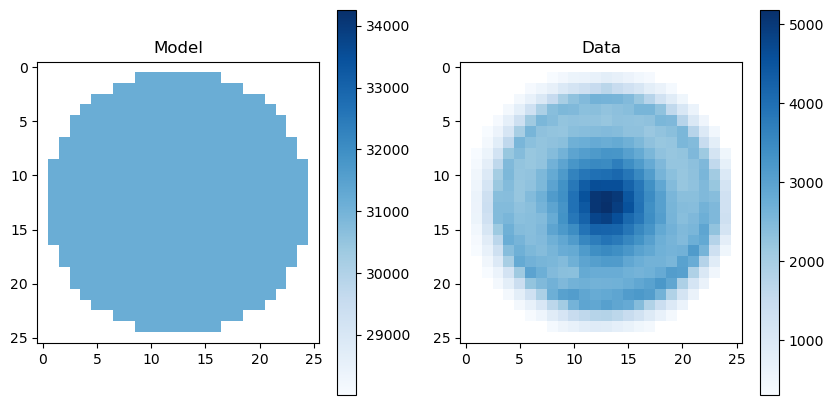

...

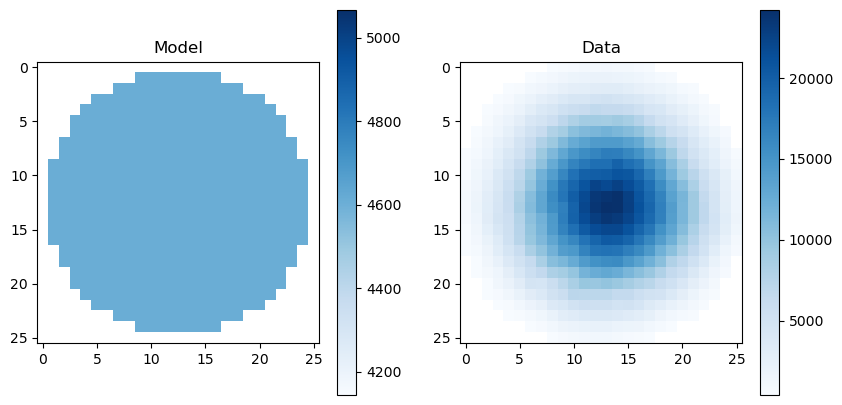

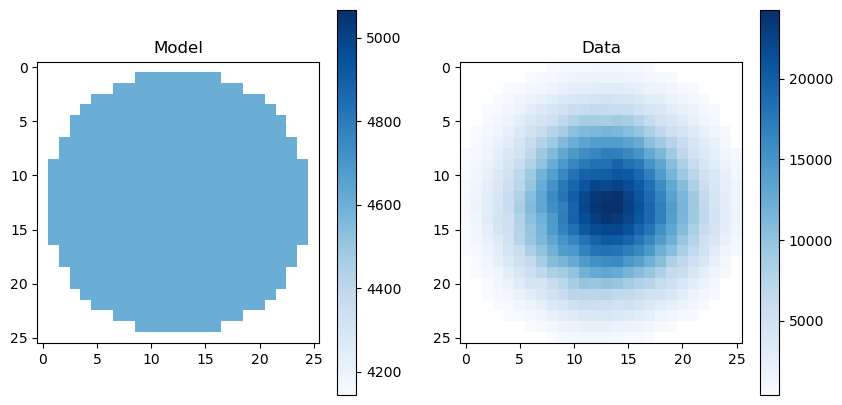

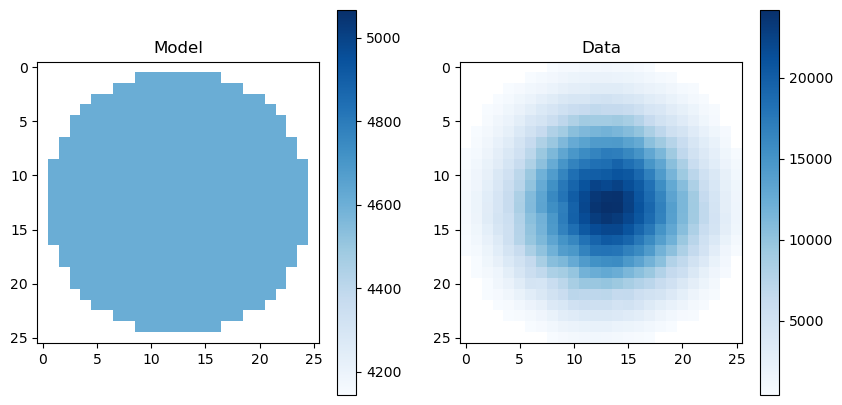

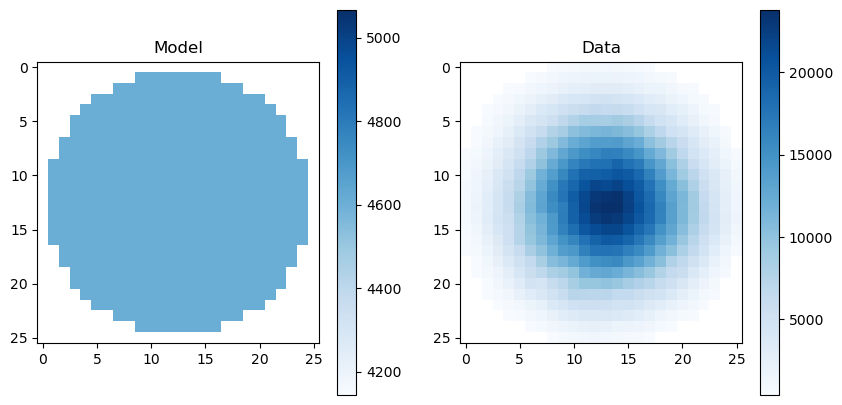

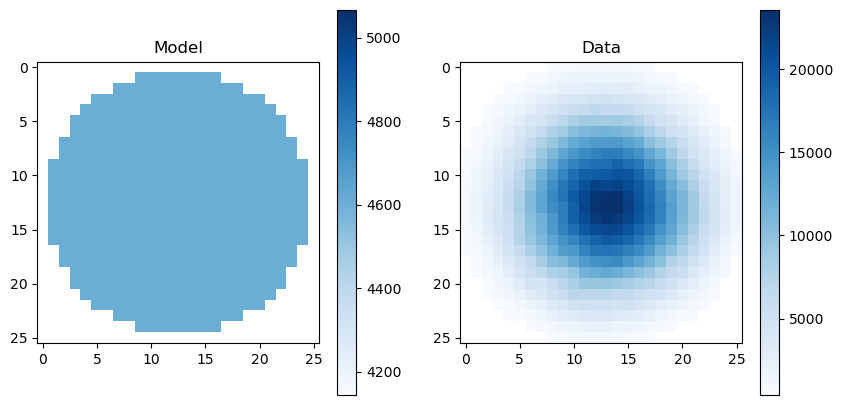

In [98]:
"""
# pLPT20 CFP
tini = 8 # initial time when wave starts hours
tfin = 36
fini = 48 # initial frame when wave starts
fend = 216 # frame when wave stops

ymin = 15
ymax = 47
pchannel = 3
imchannel = 1
color = 'Blues'
dt = 10
"""

# pLPT20 CFP IPTG
tini = 8 # initial time when wave starts hours
tfin = 36
fini = 48 # initial frame when wave starts
fend = 216 # frame when wave stops

ymin = 16
ymax = 42
pchannel = 3
imchannel = 1
color = 'Blues'
dt = 10
plot_gene_expression(tini, fini, fend, pmask, crop_im, pchannel, imchannel, color, ymin, ymax,dt)

#### Mean fluo kymos YFP

##### Image

In [99]:
im_all = crop_im[:,:,:,0]
# Assuming im_all is your image stack of shape (216, 37, 37)
nt, nx, ny = im_all.shape

# Calculate the radial distances for all pixels from the center of the image
x_center = nx // 2
y_center = ny // 2
y, x = np.ogrid[:ny, :nx]
radii = np.sqrt((x - x_center)**2 + (y - y_center)**2)

# Define the radial bands (you can adjust the range if needed)
rs = np.arange(1, im_all.shape[1] // 2)  # Radial distances (from 1 to 18)

# Initialize an array to store the mean intensity for each band over time
imrmean = np.zeros((nt, len(rs))) + np.nan

# Loop over each time point and calculate the mean for each radial band
for t in range(nt):
    for i, r in enumerate(rs):
        # Get the pixels that fall within the current radial band
        mask = (radii >= r - 0.5) & (radii < r + 0.5)
        
        # Extract the corresponding pixel values from the image
        pixels_in_band = im_all[t, mask]
        
        # Calculate the mean for the radial band, ignoring NaNs
        if len(pixels_in_band) > 0:
            imrmean[t, i] = np.nanmean(pixels_in_band)

# Now, rmean contains the kymograph: time (216) by radial distance (19)

IndexError: boolean index did not match indexed array along dimension 1; dimension is 57 but corresponding boolean dimension is 58

##### Model

In [108]:
im_all = pmask[:,:,:,2]
nt,nx,ny = im_all.shape
# Assuming im_all is your image stack of shape (216, 37, 37)
#nt = 192
nt = fend
# Calculate the radial distances for all pixels from the center of the image
x_center = nx // 2
y_center = ny // 2
y, x = np.ogrid[:ny, :nx]
radii = np.sqrt((x - x_center)**2 + (y - y_center)**2)

# Define the radial bands (you can adjust the range if needed)
rs = np.arange(1, nx // 2)  # Radial distances (from 1 to 18)

# Initialize an array to store the mean intensity for each band over time
mrmean = np.zeros((nt, len(rs))) + np.nan

# Loop over each time point and calculate the mean for each radial band

tbase = 48
#tim = 100

for tim in range(tbase,nt):
    tmodel = int((tim - tbase) * 60 * 10 / dt)
    t = tmodel
    for i, r in enumerate(rs):
        # Get the pixels that fall within the current radial band
        mask = (radii >= r - 0.5) & (radii < r + 0.5)
        
        # Extract the corresponding pixel values from the image
        pixels_in_band = im_all[t, mask]
        
        # Calculate the mean for the radial band, ignoring NaNs
        if len(pixels_in_band) > 0:
            mrmean[tim, i] = np.nanmean(pixels_in_band)

# Now, rmean contains the kymograph: time (216) by radial distance (19)

/tmp/ipykernel_11130/2659944610.py:35: RuntimeWarning: Mean of empty slice
  mrmean[tim, i] = np.nanmean(pixels_in_band)


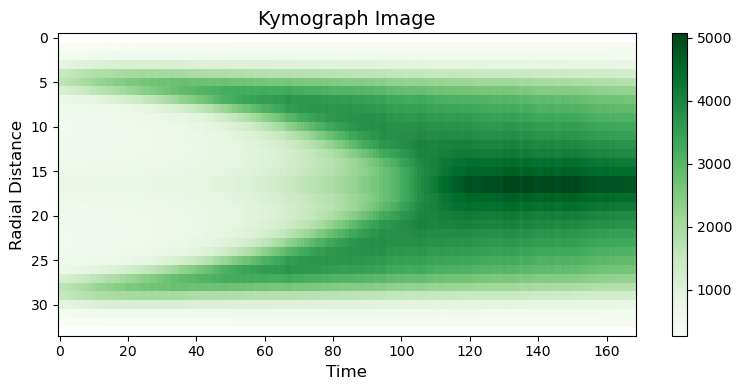

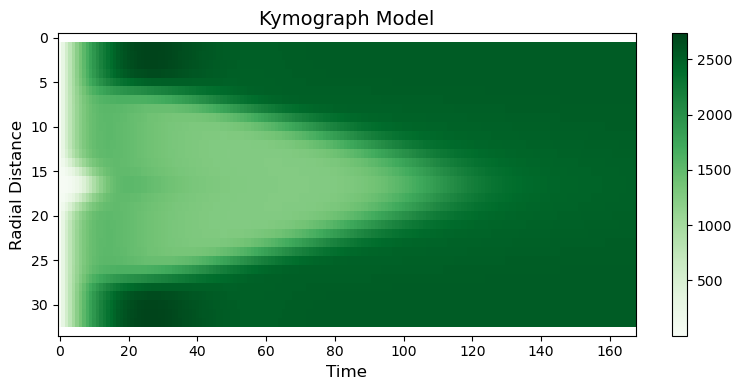

"\nplt.figure(figsize=(8, 4))\n\n# Mirror the kymograph by flipping along the radial axis and concatenating\nmkymograph = np.hstack([mrmean[:, ::-1], mrmean[:, :]])\n\n# Plot the kymograph with a tight aspect ratio\nplt.imshow(mkymograph.T[7:29,72:], aspect='auto', cmap='Greens')\n\n# Add labels and titles if needed\nplt.title('Kymograph Model', fontsize=14)\nplt.xlabel('Time', fontsize=12)\nplt.ylabel('Radial Distance', fontsize=12)\nplt.colorbar()\n# Tighten the layout\nplt.tight_layout()\n\n# Show the plot\nplt.show()\n"

In [116]:
ymin = 12
ymax = 46
plt.figure(figsize=(8, 4))

# Mirror the kymograph by flipping along the radial axis and concatenating
imkymograph = np.hstack([imrmean[:fend+1, ::-1], imrmean[:fend+1, :]])

# Plot the kymograph with a tight aspect ratio
plt.imshow(imkymograph.T[ymin:ymax,fini:], aspect='auto', cmap='Greens')

# Add labels and titles if needed
plt.title('Kymograph Image', fontsize=14)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Radial Distance', fontsize=12)
plt.colorbar()
# Tighten the layout
plt.tight_layout()

# Show the plot
plt.show()

#"""
plt.figure(figsize=(8, 4))

# Mirror the kymograph by flipping along the radial axis and concatenating
mkymograph = np.hstack([mrmean[:, ::-1], mrmean[:, :]])

# Plot the kymograph with a tight aspect ratio
plt.imshow(mkymograph.T[ymin:ymax,fini:], aspect='auto', cmap='Greens')

# Add labels and titles if needed
plt.title('Kymograph Model', fontsize=14)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Radial Distance', fontsize=12)
plt.colorbar()
# Tighten the layout
plt.tight_layout()

# Show the plot
plt.show()
#"""
"""
plt.figure(figsize=(8, 4))

# Mirror the kymograph by flipping along the radial axis and concatenating
mkymograph = np.hstack([mrmean[:, ::-1], mrmean[:, :]])

# Plot the kymograph with a tight aspect ratio
plt.imshow(mkymograph.T[7:29,72:], aspect='auto', cmap='Greens')

# Add labels and titles if needed
plt.title('Kymograph Model', fontsize=14)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Radial Distance', fontsize=12)
plt.colorbar()
# Tighten the layout
plt.tight_layout()

# Show the plot
plt.show()
"""

#### Kymos mean fluo CFP

##### Image

In [118]:
im_all = crop_im[:,:,:,1]
# Assuming im_all is your image stack of shape (216, 37, 37)
nt, nx, ny = im_all.shape

# Calculate the radial distances for all pixels from the center of the image
x_center = nx // 2
y_center = ny // 2
y, x = np.ogrid[:ny, :nx]
radii = np.sqrt((x - x_center)**2 + (y - y_center)**2)

# Define the radial bands (you can adjust the range if needed)
rs = np.arange(1, im_all.shape[1] // 2)  # Radial distances (from 1 to 18)

# Initialize an array to store the mean intensity for each band over time
imrmean = np.zeros((nt, len(rs))) + np.nan

# Loop over each time point and calculate the mean for each radial band
for t in range(nt):
    for i, r in enumerate(rs):
        # Get the pixels that fall within the current radial band
        mask = (radii >= r - 0.5) & (radii < r + 0.5)
        
        # Extract the corresponding pixel values from the image
        pixels_in_band = im_all[t, mask]
        
        # Calculate the mean for the radial band, ignoring NaNs
        if len(pixels_in_band) > 0:
            imrmean[t, i] = np.nanmean(pixels_in_band)

# Now, rmean contains the kymograph: time (216) by radial distance (19)

/tmp/ipykernel_11130/3267225925.py:28: RuntimeWarning: Mean of empty slice
  imrmean[t, i] = np.nanmean(pixels_in_band)


##### Model

In [117]:
im_all = pmask[:,:,:,3]
nt,nx,ny = im_all.shape
# Assuming im_all is your image stack of shape (216, 37, 37)
#nt = 192
nt = fend
# Calculate the radial distances for all pixels from the center of the image
x_center = nx // 2
y_center = ny // 2
y, x = np.ogrid[:ny, :nx]
radii = np.sqrt((x - x_center)**2 + (y - y_center)**2)

# Define the radial bands (you can adjust the range if needed)
rs = np.arange(1, nx // 2)  # Radial distances (from 1 to 18)

# Initialize an array to store the mean intensity for each band over time
mrmean = np.zeros((nt, len(rs))) + np.nan

# Loop over each time point and calculate the mean for each radial band

tbase = 48
tim = 100

for tim in range(tbase,nt):
    tmodel = int((tim - tbase) * 60 * 10 / dt)
    t = tmodel
    for i, r in enumerate(rs):
        # Get the pixels that fall within the current radial band
        mask = (radii >= r - 0.5) & (radii < r + 0.5)
        
        # Extract the corresponding pixel values from the image
        pixels_in_band = im_all[t, mask]
        
        # Calculate the mean for the radial band, ignoring NaNs
        if len(pixels_in_band) > 0:
            mrmean[tim, i] = np.nanmean(pixels_in_band)

# Now, rmean contains the kymograph: time (216) by radial distance (19)

/tmp/ipykernel_11130/2500873364.py:35: RuntimeWarning: Mean of empty slice
  mrmean[tim, i] = np.nanmean(pixels_in_band)


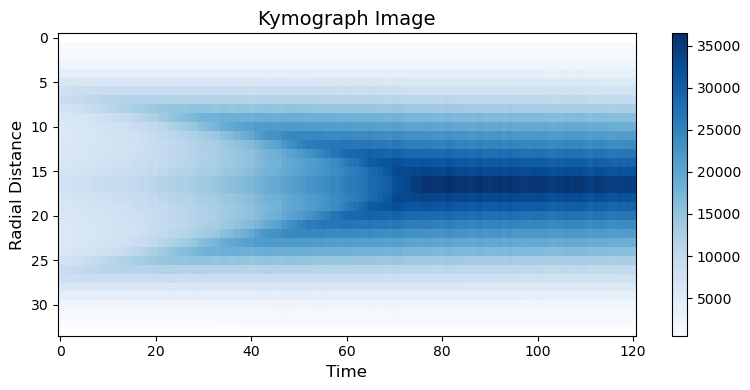

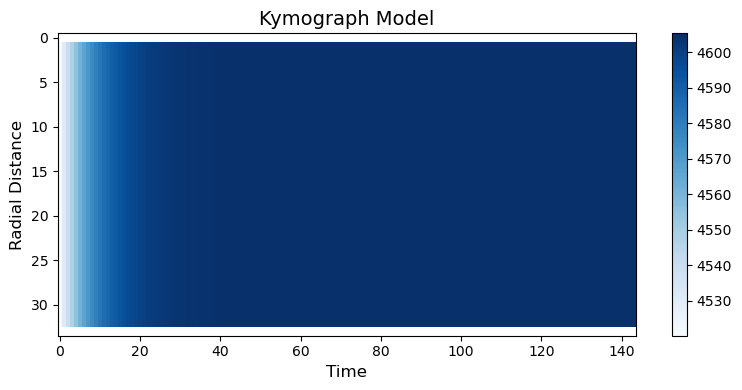

"\nplt.figure(figsize=(8, 4))\n\n# Mirror the kymograph by flipping along the radial axis and concatenating\nmkymograph = np.hstack([mrmean[:, ::-1], mrmean[:, :]])\n\n# Plot the kymograph with a tight aspect ratio\nplt.imshow(mkymograph.T[7:29,72:], aspect='auto', cmap='Greens')\n\n# Add labels and titles if needed\nplt.title('Kymograph Model', fontsize=14)\nplt.xlabel('Time', fontsize=12)\nplt.ylabel('Radial Distance', fontsize=12)\nplt.colorbar()\n# Tighten the layout\nplt.tight_layout()\n\n# Show the plot\nplt.show()\n"

In [121]:
ymin = 12
ymax = 46
plt.figure(figsize=(8, 4))

# Mirror the kymograph by flipping along the radial axis and concatenating
imkymograph = np.hstack([imrmean[:fend+1, ::-1], imrmean[:fend+1, :]])

# Plot the kymograph with a tight aspect ratio
plt.imshow(imkymograph.T[ymin:ymax,fini:], aspect='auto', cmap='Blues')

# Add labels and titles if needed
plt.title('Kymograph Image', fontsize=14)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Radial Distance', fontsize=12)
plt.colorbar()
# Tighten the layout
plt.tight_layout()

# Show the plot
plt.show()

#"""
plt.figure(figsize=(8, 4))

# Mirror the kymograph by flipping along the radial axis and concatenating
mkymograph = np.hstack([mrmean[:, ::-1], mrmean[:, :]])

# Plot the kymograph with a tight aspect ratio
plt.imshow(mkymograph.T[ymin:ymax,fini:], aspect='auto', cmap='Blues')

# Add labels and titles if needed
plt.title('Kymograph Model', fontsize=14)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Radial Distance', fontsize=12)
plt.colorbar()
# Tighten the layout
plt.tight_layout()

# Show the plot
plt.show()
#"""
"""
plt.figure(figsize=(8, 4))

# Mirror the kymograph by flipping along the radial axis and concatenating
mkymograph = np.hstack([mrmean[:, ::-1], mrmean[:, :]])

# Plot the kymograph with a tight aspect ratio
plt.imshow(mkymograph.T[7:29,72:], aspect='auto', cmap='Greens')

# Add labels and titles if needed
plt.title('Kymograph Model', fontsize=14)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Radial Distance', fontsize=12)
plt.colorbar()
# Tighten the layout
plt.tight_layout()

# Show the plot
plt.show()
"""

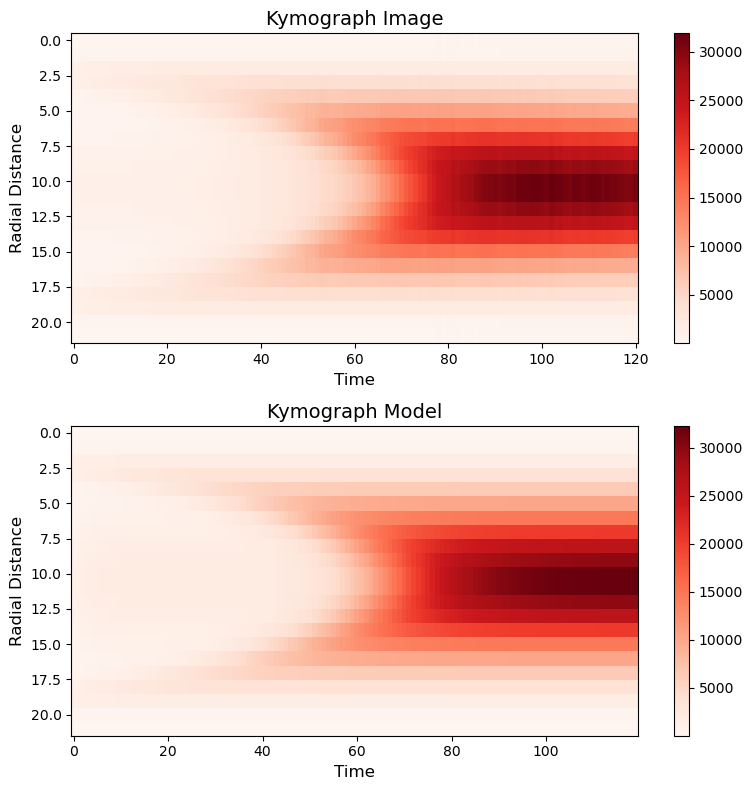

In [26]:
fini = 72
fend = 192
ymin = 7
ymax = 29
plot_kymos(imrmean,fini, fend,mrmean,ymin, ymax)

#### Mean fluo kymos IPTG

In [100]:
# pLPT20 YFP IPTG
tini = 8 # initial time when wave starts hours
tfin = 36
fini = 48 # initial frame when wave starts
fend = 216 # frame when wave stops

ymin = 16
ymax = 42
pchannel = 2
imchannel = 0
color = 'Greens'
dt = 10

##### Image

In [104]:
im_all.shape

(216, 57, 58)

In [115]:
im_all[100,:,:57].shape

(57, 57)

In [117]:
pmask.shape

(10081, 57, 58, 4)

In [116]:
im_all = crop_im[:,:,:57,0]
# Assuming im_all is your image stack of shape (216, 37, 37)
nt, nx, ny = im_all.shape

# Calculate the radial distances for all pixels from the center of the image
x_center = nx // 2
y_center = ny // 2
y, x = np.ogrid[:ny, :nx]
radii = np.sqrt((x - x_center)**2 + (y - y_center)**2)

# Define the radial bands (you can adjust the range if needed)
rs = np.arange(1, im_all.shape[1] // 2)  # Radial distances (from 1 to 18)

# Initialize an array to store the mean intensity for each band over time
imrmean = np.zeros((nt, len(rs))) + np.nan

# Loop over each time point and calculate the mean for each radial band
for t in range(nt):
    for i, r in enumerate(rs):
        # Get the pixels that fall within the current radial band
        mask = (radii >= r - 0.5) & (radii < r + 0.5)
        
        # Extract the corresponding pixel values from the image
        pixels_in_band = im_all[t, mask]
        
        # Calculate the mean for the radial band, ignoring NaNs
        if len(pixels_in_band) > 0:
            imrmean[t, i] = np.nanmean(pixels_in_band)

# Now, rmean contains the kymograph: time (216) by radial distance (19)

/tmp/ipykernel_28223/1826220324.py:28: RuntimeWarning: Mean of empty slice
  imrmean[t, i] = np.nanmean(pixels_in_band)


##### Model

In [118]:
im_all = pmask[:,:,:57,2]
nt,nx,ny = im_all.shape
# Assuming im_all is your image stack of shape (216, 37, 37)
#nt = 192
nt = fend
# Calculate the radial distances for all pixels from the center of the image
x_center = nx // 2
y_center = ny // 2
y, x = np.ogrid[:ny, :nx]
radii = np.sqrt((x - x_center)**2 + (y - y_center)**2)

# Define the radial bands (you can adjust the range if needed)
rs = np.arange(1, nx // 2)  # Radial distances (from 1 to 18)

# Initialize an array to store the mean intensity for each band over time
mrmean = np.zeros((nt, len(rs))) + np.nan

# Loop over each time point and calculate the mean for each radial band

tbase = 48
tim = 100

for tim in range(tbase,nt):
    tmodel = int((tim - tbase) * 60 * 10 / dt)
    t = tmodel
    for i, r in enumerate(rs):
        # Get the pixels that fall within the current radial band
        mask = (radii >= r - 0.5) & (radii < r + 0.5)
        
        # Extract the corresponding pixel values from the image
        pixels_in_band = im_all[t, mask]
        
        # Calculate the mean for the radial band, ignoring NaNs
        if len(pixels_in_band) > 0:
            mrmean[tim, i] = np.nanmean(pixels_in_band)

# Now, rmean contains the kymograph: time (216) by radial distance (19)

/tmp/ipykernel_28223/3585601789.py:35: RuntimeWarning: Mean of empty slice
  mrmean[tim, i] = np.nanmean(pixels_in_band)


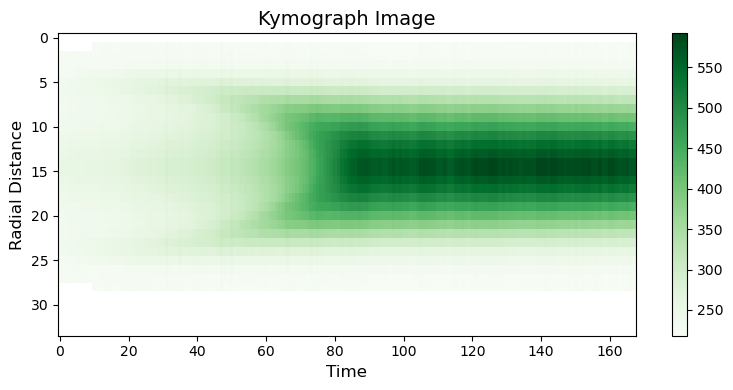

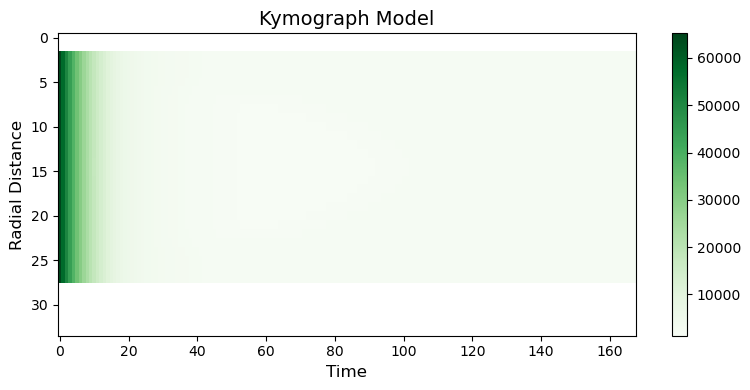

"\nplt.figure(figsize=(8, 4))\n\n# Mirror the kymograph by flipping along the radial axis and concatenating\nmkymograph = np.hstack([mrmean[:, ::-1], mrmean[:, :]])\n\n# Plot the kymograph with a tight aspect ratio\nplt.imshow(mkymograph.T[7:29,72:], aspect='auto', cmap='Greens')\n\n# Add labels and titles if needed\nplt.title('Kymograph Model', fontsize=14)\nplt.xlabel('Time', fontsize=12)\nplt.ylabel('Radial Distance', fontsize=12)\nplt.colorbar()\n# Tighten the layout\nplt.tight_layout()\n\n# Show the plot\nplt.show()\n"

In [120]:
ymin = 12
ymax = 46
plt.figure(figsize=(8, 4))

# Mirror the kymograph by flipping along the radial axis and concatenating
imkymograph = np.hstack([imrmean[:fend+1, ::-1], imrmean[:fend+1, :]])

# Plot the kymograph with a tight aspect ratio
plt.imshow(imkymograph.T[ymin:ymax,fini:], aspect='auto', cmap='Greens')

# Add labels and titles if needed
plt.title('Kymograph Image', fontsize=14)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Radial Distance', fontsize=12)
plt.colorbar()
# Tighten the layout
plt.tight_layout()

# Show the plot
plt.show()

#"""
plt.figure(figsize=(8, 4))

# Mirror the kymograph by flipping along the radial axis and concatenating
mkymograph = np.hstack([mrmean[:, ::-1], mrmean[:, :]])

# Plot the kymograph with a tight aspect ratio
plt.imshow(mkymograph.T[ymin:ymax,fini:], aspect='auto', cmap='Greens')

# Add labels and titles if needed
plt.title('Kymograph Model', fontsize=14)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Radial Distance', fontsize=12)
plt.colorbar()
# Tighten the layout
plt.tight_layout()

# Show the plot
plt.show()
#"""
"""
plt.figure(figsize=(8, 4))

# Mirror the kymograph by flipping along the radial axis and concatenating
mkymograph = np.hstack([mrmean[:, ::-1], mrmean[:, :]])

# Plot the kymograph with a tight aspect ratio
plt.imshow(mkymograph.T[7:29,72:], aspect='auto', cmap='Greens')

# Add labels and titles if needed
plt.title('Kymograph Model', fontsize=14)
plt.xlabel('Time', fontsize=12)
plt.ylabel('Radial Distance', fontsize=12)
plt.colorbar()
# Tighten the layout
plt.tight_layout()

# Show the plot
plt.show()
"""

#### Delta computation

In [19]:
idx0

36

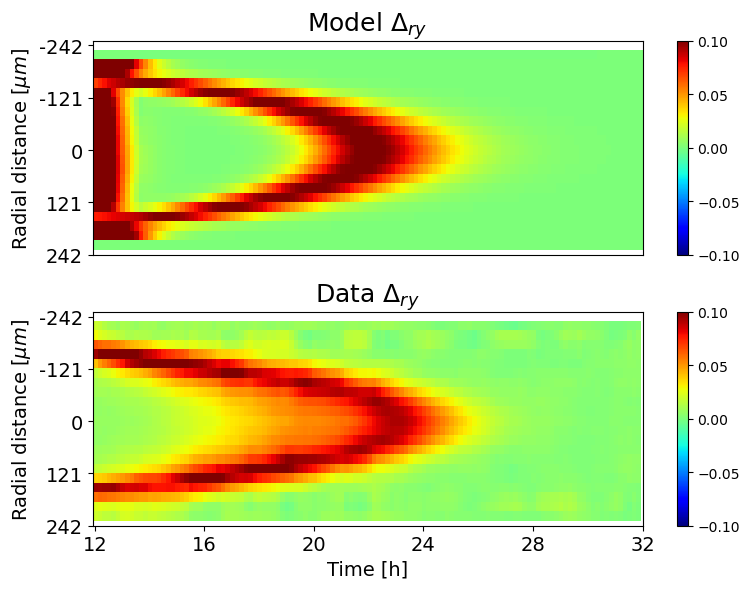

In [24]:
plt.figure(figsize=(8,6))
ylim = (edt.max() +16)* 1.35  # New ylim calculation

idx0 = int(12 * 60 * 60 // dt // 60)  # when start after growth rate
idx1 = int(32 * 60 * 60 // dt // 60)  # when wave arrives

# First subplot (Model)
plt.subplot(2, 1, 1)
plt.imshow(mdslrho[:, int(nx // 2), 7:29].transpose(), aspect='auto', cmap='jet', vmin=-0.1, vmax=0.1)
plt.title('Model $\Delta_{ry}$', fontsize=18)  # Title with fontsize 18
plt.colorbar()
plt.xticks([])  # Remove x-ticks for the top plot
plt.yticks(np.linspace(0, mdslrho[:, int(nx // 2), 7:29].shape[1], num=5), labels=np.linspace(-ylim, ylim, num=5).astype(int), fontsize=14)  # Y-ticks using ylim, fontsize 14
plt.ylabel('Radial distance [$\mu m$]', fontsize=14)  # Y-axis label font size 14

# Second subplot (Data)
plt.subplot(2, 1, 2)
plt.imshow(dslrho_01[idx0:idx1, int(nx // 2), 7:29].transpose(), aspect='auto', cmap='jet', vmin=-0.1, vmax=0.1)
plt.title('Data $\Delta_{ry}$', fontsize=18)  # Title with fontsize 18
plt.colorbar()

# Set the x-ticks and labels
xtick_positions = np.linspace(0, idx1 - idx0, num=6)  # Generate tick positions for the whole range
xtick_labels = np.linspace(12, 32, num=6, dtype=int)  # Adjust labels accordingly
plt.xticks(xtick_positions, labels=xtick_labels, fontsize=14)  # X-ticks with fontsize 14
plt.yticks(np.linspace(0, dslrho_01[idx0:idx1, int(nx // 2), 7:29].shape[1], num=5), labels=np.linspace(-ylim, ylim, num=5).astype(int), fontsize=14)  # Y-ticks using ylim, fontsize 14
plt.xlabel('Time [h]', fontsize=14)  # X-axis label font size 14
plt.ylabel('Radial distance [$\mu m$]', fontsize=14)  # Y-axis label font size 14

plt.tight_layout()
plt.show()

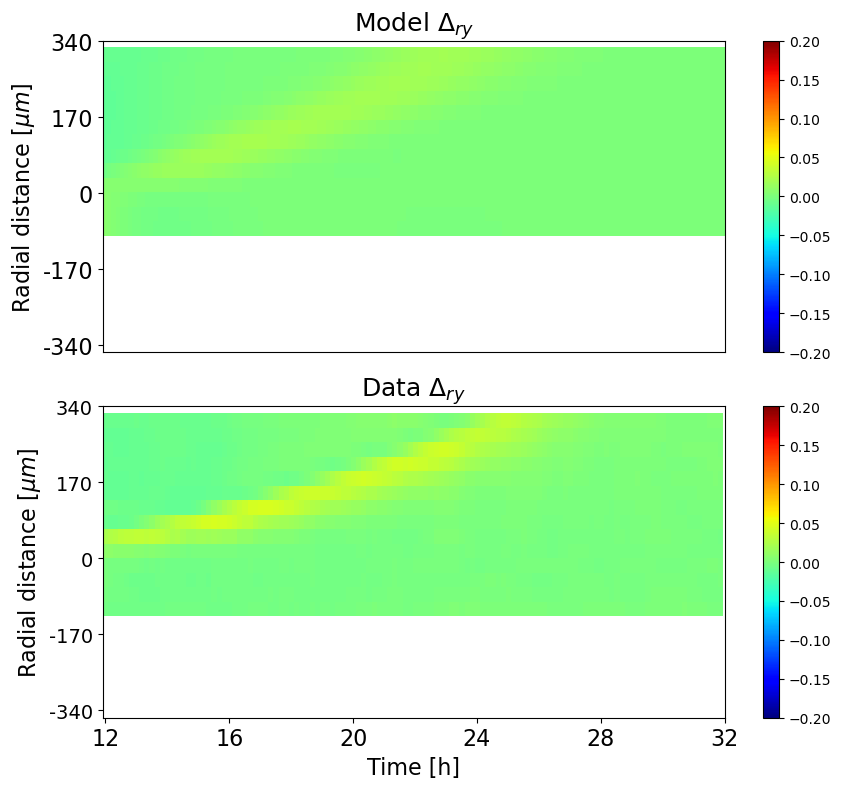

In [18]:
ylim = (edt.max() +16)* 1.35  # New ylim calculation
tini = 12
tend = 32
ymin = 8
ymax = 29
filename = 'pAAA_delta.png'
vmin = -0.2
vmax = 0.2
plot_delta(ylim,tini,tend,ymin, ymax,dt,filename,vmin,vmax)

#### pLPT20

In [19]:
# pLPT20 YFP
tini = 8 # initial time when wave starts hours
tfin = 36
fini = 48 # initial frame when wave starts
fend = 216 # frame when wave stops

ymin = 15
ymax = 46
pchannel = 2
imchannel = 0
color = 'Blues'
dt = 10

In [20]:
vmin = -0.05
vmax = 0.05

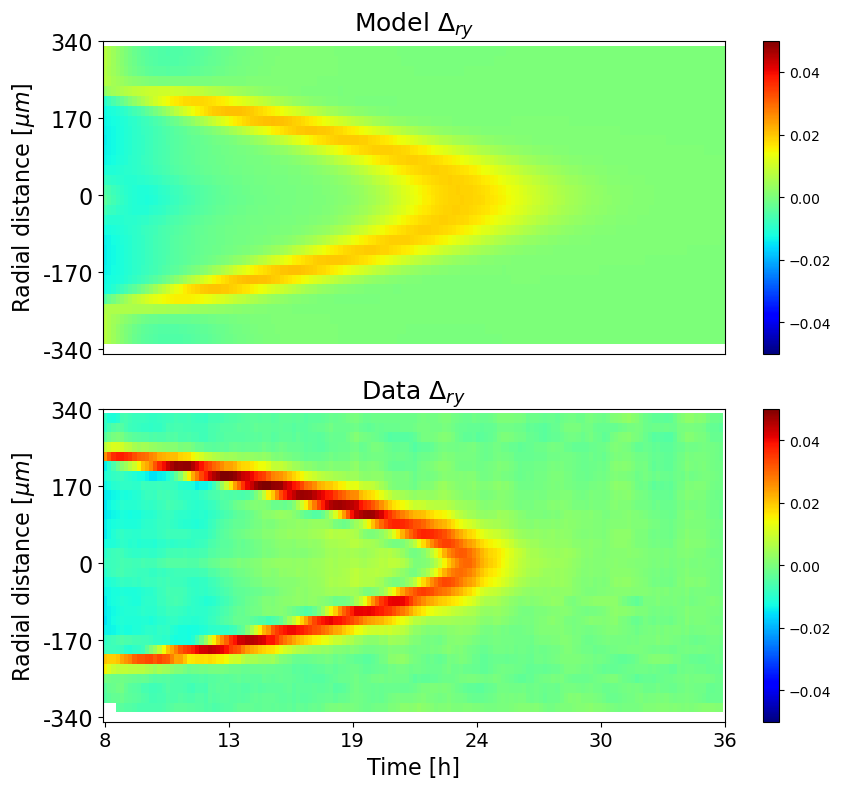

In [22]:
#plt.subplot(2, 1, 1)
#plt.imshow(mdslrho[:,int(nx//2),:].transpose(), aspect='auto', cmap='jet', vmin=-0.05, vmax=0.05) #, extent=[0, 16 * ny, dt * ts[-1] / 60 / 60, 0])
#plt.colorbar()

plt.figure(figsize=(9,8))
ylim = (edt.max() +16)* 1.35  # New ylim calculation

# First subplot (Model)
plt.subplot(2, 1, 1)
plt.imshow(mdslrho[:, int(nx // 2), ymin:ymax].transpose(), aspect='auto', cmap='jet',origin='lower', vmin=vmin, vmax=vmax)
plt.title('Model $\Delta_{ry}$', fontsize=18)  # Title with fontsize 18
plt.colorbar()
plt.xticks([])  # Remove x-ticks for the top plot
plt.yticks(np.linspace(0, mdslrho[:, int(nx // 2), ymin:ymax].shape[1], num=5), labels=np.linspace(-ylim, ylim, num=5).astype(int), fontsize=16)  # Y-ticks using ylim, fontsize 14
plt.ylabel('Radial distance [$\mu m$]', fontsize=16)  # Y-axis label font size 14


idx0 = int(8 * 60 * 60 // dt // 60)
idx1 = int(36 * 60 * 60 // dt // 60)

#plt.subplot(2, 1, 2)
#plt.imshow(dslrho_01[idx0+20:idx1,int(nx//2),:].transpose(), aspect='auto', cmap='jet', vmin=-0.05, vmax=0.05) #, extent=[0, 16 * ny, dt * ts[-1] / 60 / 60, 0])
#plt.colorbar()

# Second subplot (Data)
plt.subplot(2, 1, 2)
plt.imshow(dslrho_01[idx0+20:idx1, int(nx // 2), ymin-1:ymax].transpose(), aspect='auto', cmap='jet',origin='lower', vmin=vmin, vmax=vmax)
plt.title('Data $\Delta_{ry}$', fontsize=18)  # Title with fontsize 18
plt.colorbar()

# Set the x-ticks and labels
xtick_positions = np.linspace(0, idx1 - idx0-20, num=6)  # Generate tick positions for the whole range
xtick_labels = np.linspace(tini, tfin, num=6, dtype=int)  # Adjust labels accordingly
plt.xticks(xtick_positions, labels=xtick_labels, fontsize=14)  # X-ticks with fontsize 14
plt.yticks(np.linspace(0, dslrho_01[idx0+20:idx1, int(nx // 2), ymin-1:ymax].shape[1], num=5), labels=np.linspace(-ylim, ylim, num=5).astype(int), fontsize=16)  # Y-ticks using ylim, fontsize 14
plt.xlabel('Time [h]', fontsize=16)  # X-axis label font size 14
plt.ylabel('Radial distance [$\mu m$]', fontsize=16)  # Y-axis label font size 14

plt.tight_layout()
plt.savefig('pLPT20_delta.png',dpi=300)

#### IPTG

In [93]:
vmin = -0.04
vmax = 0.04
tini = 8

In [95]:
mdslrho = mdslrho[:,:,:57]
dslrho_01 = dslrho_01[:,:,:57]

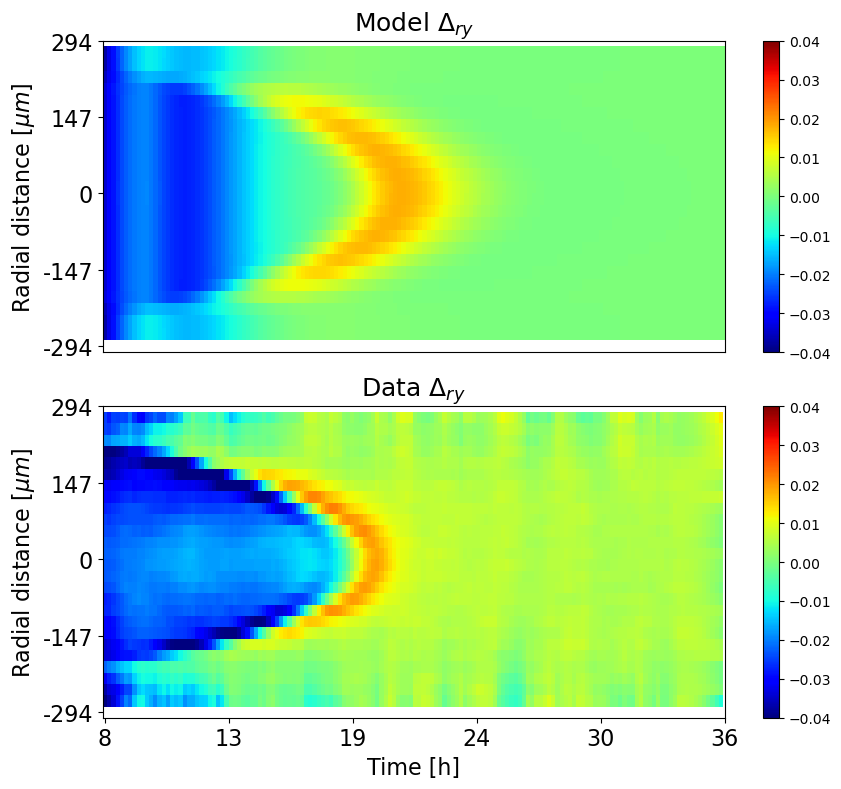

In [113]:
#plt.subplot(2, 1, 1)
#plt.imshow(mdslrho[:,int(nx//2),:].transpose(), aspect='auto', cmap='jet', vmin=-0.05, vmax=0.05) #, extent=[0, 16 * ny, dt * ts[-1] / 60 / 60, 0])
#plt.colorbar()

ymin = 16
ymax = 41

plt.figure(figsize=(9,8))
ylim = (edt.max() +16)* 1.35  # New ylim calculation

# First subplot (Model)
plt.subplot(2, 1, 1)
plt.imshow(mdslrho[:, int(nx // 2), ymin:ymax].transpose(), aspect='auto', cmap='jet',origin='lower', vmin=vmin, vmax=vmax)
plt.title('Model $\Delta_{ry}$', fontsize=18)  # Title with fontsize 18
plt.colorbar()
plt.xticks([])  # Remove x-ticks for the top plot
plt.yticks(np.linspace(0, mdslrho[:, int(nx // 2), ymin:ymax].shape[1], num=5), labels=np.linspace(-ylim, ylim, num=5).astype(int), fontsize=16)  # Y-ticks using ylim, fontsize 14
#plt.gca().invert_yaxis()
plt.ylabel('Radial distance [$\mu m$]', fontsize=16)  # Y-axis label font size 14


idx0 = int(8 * 60 * 60 // dt // 60)
idx1 = int(36 * 60 * 60 // dt // 60)

#plt.subplot(2, 1, 2)
#plt.imshow(dslrho_01[idx0+20:idx1,int(nx//2),:].transpose(), aspect='auto', cmap='jet', vmin=-0.05, vmax=0.05) #, extent=[0, 16 * ny, dt * ts[-1] / 60 / 60, 0])
#plt.colorbar()

# Second subplot (Data)
plt.subplot(2, 1, 2)
plt.imshow(dslrho_01[idx0+20:idx1, int(nx // 2), ymin-1:ymax+1].transpose(), aspect='auto', cmap='jet',origin='lower', vmin=vmin, vmax=vmax)
plt.title('Data $\Delta_{ry}$', fontsize=18)  # Title with fontsize 18
plt.colorbar()

# Set the x-ticks and labels
xtick_positions = np.linspace(0, idx1 - idx0-20, num=6)  # Generate tick positions for the whole range
xtick_labels = np.linspace(tini, tfin, num=6, dtype=int)  # Adjust labels accordingly
plt.xticks(xtick_positions, labels=xtick_labels, fontsize=16)  # X-ticks with fontsize 14
plt.yticks(np.linspace(0, dslrho_01[idx0+20:idx1, int(nx // 2), ymin-1:ymax+1].shape[1], num=5), labels=np.linspace(-ylim, ylim, num=5).astype(int), fontsize=16)  # Y-ticks using ylim, fontsize 14
#plt.gca().invert_yaxis()
plt.xlabel('Time [h]', fontsize=16)  # X-axis label font size 14
plt.ylabel('Radial distance [$\mu m$]', fontsize=16)  # Y-axis label font size 14

plt.tight_layout()
plt.savefig('pLPT20_IPTG_delta.png',dpi=300)